In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

%matplotlib inline

#QUESTION 1

(np.float64(-0.5), np.float64(1033.5), np.float64(729.5), np.float64(-0.5))

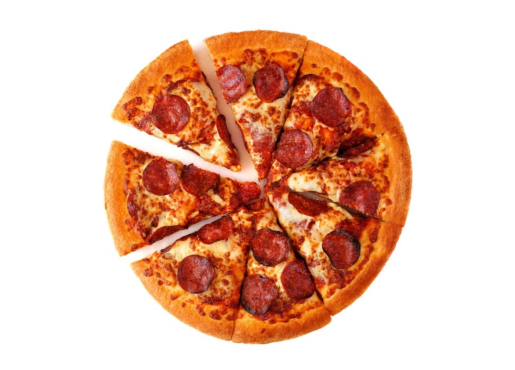

In [ ]:
image1 = cv2.imread('./pizza.jpg')
image_copy1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)

plt.imshow(image_copy1)
plt.axis("off")

(np.float64(-0.5), np.float64(1033.5), np.float64(729.5), np.float64(-0.5))

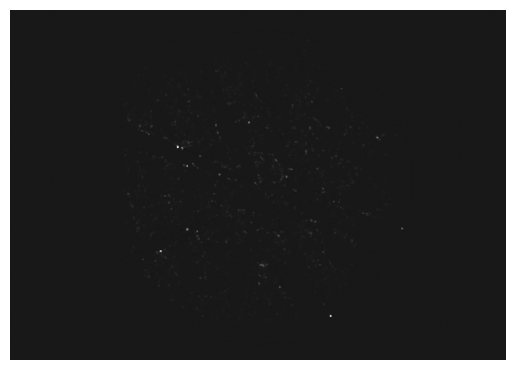

In [ ]:
gray = cv2.cvtColor(image_copy1, cv2.COLOR_RGB2GRAY)
gray = np.float32(gray)
pizza = cv2.cornerHarris(gray, 2, 3, 0.04) #img, windows, threshold
pizza = cv2.dilate(pizza,None)

plt.imshow(pizza, cmap='gray')
plt.axis("off")

Harris Corner Detection algorithm

*  struggles with the smooth circular edges of pepperoni
*  YES !! The Crust are detected as edges
*  detects many "corners" on the textured cheese and sharp crust edges



(np.float64(-0.5), np.float64(1033.5), np.float64(729.5), np.float64(-0.5))

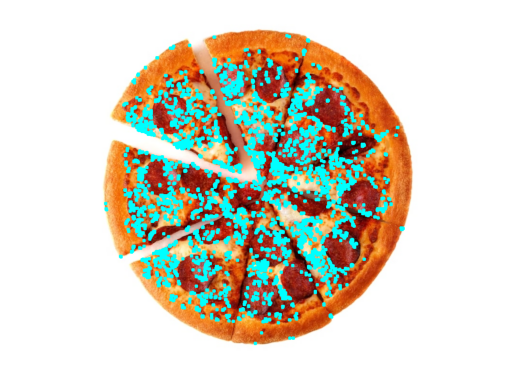

In [ ]:
threshold = 0.01*pizza.max()
pizza_image = np.copy(image_copy1)
for j in range(0, pizza.shape[0]):
    for i in range(0, pizza.shape[1]):
        if(pizza[j,i] > threshold):
            cv2.circle( pizza_image, (i, j), 1, (0,255,255), 2)

plt.imshow(pizza_image)
plt.axis("off")

(np.float64(-0.5), np.float64(1147.5), np.float64(765.5), np.float64(-0.5))

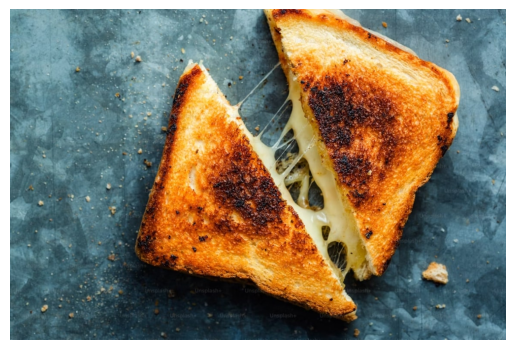

In [ ]:
image2 = cv2.imread('./sandwich.jpg')
image_copy2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

plt.imshow(image_copy2)
plt.axis("off")

(np.float64(-0.5), np.float64(1147.5), np.float64(765.5), np.float64(-0.5))

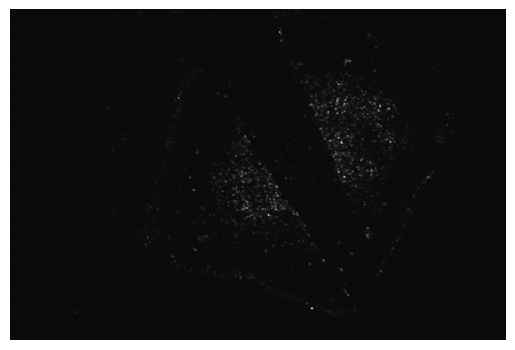

In [ ]:
gray = cv2.cvtColor(image_copy2, cv2.COLOR_RGB2GRAY)
gray = np.float32(gray)
sandwich = cv2.cornerHarris(gray, 2, 3, 0.04) #img, windows, threshold
sandwich = cv2.dilate(sandwich,None)

plt.imshow(sandwich, cmap='gray')
plt.axis("off")

(np.float64(-0.5), np.float64(1147.5), np.float64(765.5), np.float64(-0.5))

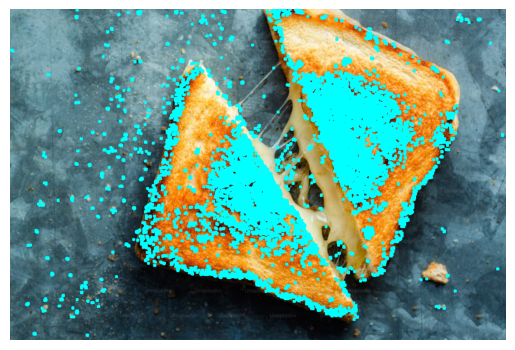

In [ ]:
threshold = 0.01*sandwich.max()
sandwich_image = np.copy(image_copy2)
for j in range(0, sandwich.shape[0]):
    for i in range(0, sandwich.shape[1]):
        if(sandwich[j,i] > threshold):
            cv2.circle( sandwich_image, (i, j), 1, (0,255,255), 2)

plt.imshow(sandwich_image)
plt.axis("off")

(np.float64(-0.5), np.float64(1147.5), np.float64(765.5), np.float64(-0.5))

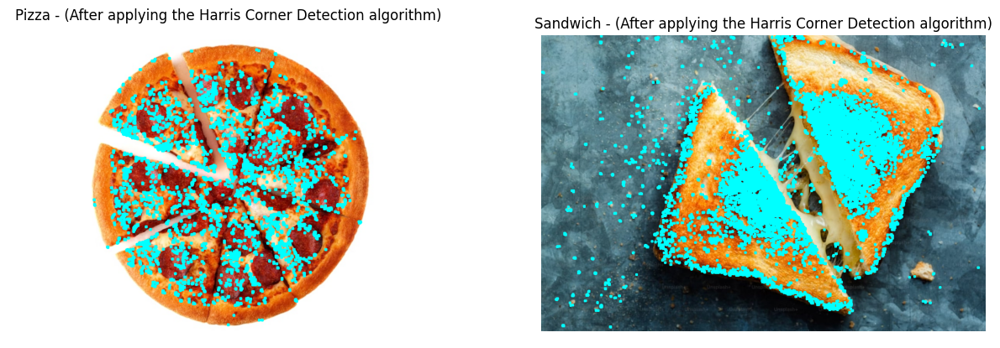

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.imshow(pizza_image)
plt.title('Pizza - (After applying the Harris Corner Detection algorithm) ')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sandwich_image)
plt.title('Sandwich - (After applying the Harris Corner Detection algorithm)')
plt.axis('off')


#QUESTION 2

##Part 1: The Cat’s Trickery

(np.float64(-0.5), np.float64(5025.5), np.float64(3457.5), np.float64(-0.5))

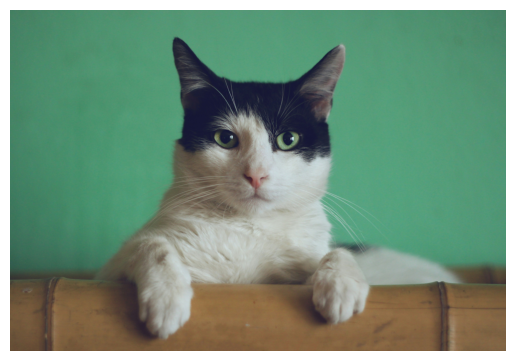

In [ ]:
image3 = cv2.imread('./cat.jpg')
image_copy3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)
transformed_images=[]
plt.imshow(image_copy3)
plt.axis("off")

###The Shrinking Spell: Scale the cat image down—now it’s small enough to hide under a digital couch!


(np.float64(-0.5), np.float64(299.5), np.float64(299.5), np.float64(-0.5))

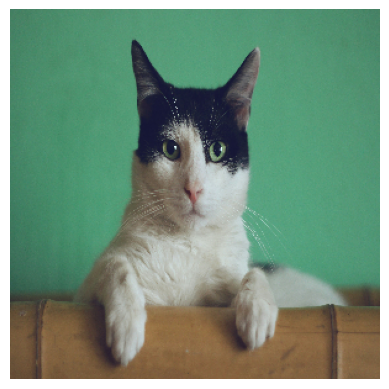

In [ ]:
resized_dim=(300,300)
resized_img=cv2.resize(image_copy3,resized_dim)
transformed_images.append(resized_img)
plt.imshow(resized_img)
plt.axis("off")

###The Teleportation Act: Translate the cat image by shifting it horizontally and vertically.

(np.float64(-0.5), np.float64(5025.5), np.float64(3457.5), np.float64(-0.5))

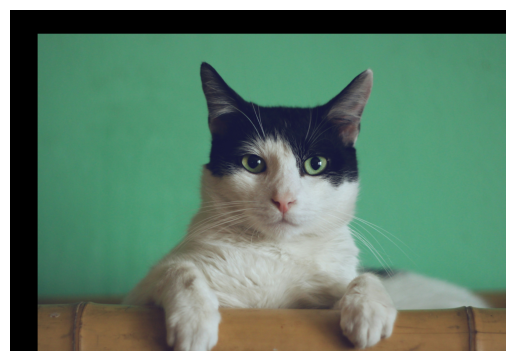

In [ ]:
x=280
y=250
translation_matrix=np.float32([[1,0,x],[0,1,y]])
translated_image=cv2.warpAffine(image_copy3, translation_matrix, (image_copy3.shape[1], image_copy3.shape[0]))
transformed_images.append(translated_image)
plt.imshow(translated_image)
plt.axis("off")

###The Twisting Tail Move: Rotate the image (e.g., by 45° or 90°)—it’s trying to confuse its pursuers!

(np.float64(-0.5), np.float64(5025.5), np.float64(3457.5), np.float64(-0.5))

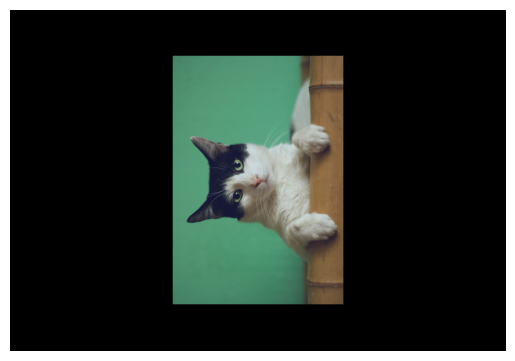

In [ ]:
rows,cols = image_copy3.shape[:2]

M = cv2.getRotationMatrix2D((cols/2,rows/2),90,0.5)
rotated_image= cv2.warpAffine(image_copy3,M,(cols,rows))
transformed_images.append(rotated_image)
plt.imshow(rotated_image)
plt.axis("off")

###The Sunbeam Glow: Brighten the image dramatically—it’s pretending to be a glowing angel.

(np.float64(-0.5), np.float64(5025.5), np.float64(3457.5), np.float64(-0.5))

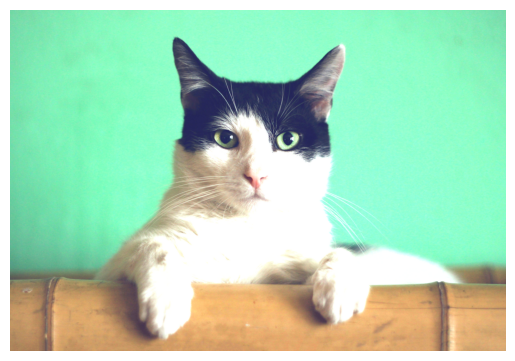

In [ ]:
def brightness_augmentation(image, factor):
  adjusted_image = np.clip(image * factor, 0, 255).astype(np.uint8)
  return adjusted_image

bright_img = brightness_augmentation(image_copy3, 1.7)
transformed_images.append(bright_img)
plt.imshow(bright_img)
plt.axis("off")


##Part 2: Deploying SIFT the Cat Tracker


In [ ]:
training_gray = cv2.cvtColor(image_copy3, cv2.COLOR_RGB2GRAY)
test_images=[]
for i in transformed_images:
  gray_cat_trans = cv2.cvtColor(i, cv2.COLOR_BGR2GRAY)
  test_images.append(gray_cat_trans)


Number of Keypoints Detected In The Training Image:  4010
Number of Keypoints Detected In The Query Image:  149 3964 675 5726


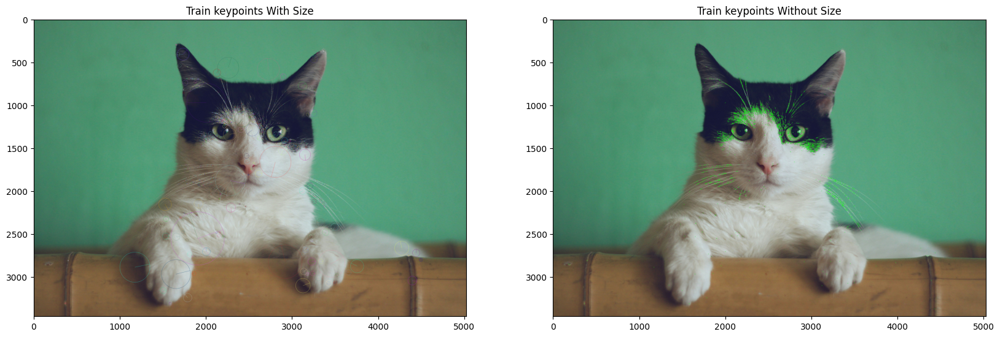

In [ ]:
sift = cv2.SIFT_create()

train_keypoints, train_descriptor = sift.detectAndCompute(training_gray, None)

test_keypoints, test_descriptor = sift.detectAndCompute(test_images[0], None)
test_keypoints2, test_descriptor2 = sift.detectAndCompute(test_images[1], None)
test_keypoints3, test_descriptor3 = sift.detectAndCompute(test_images[2], None)
test_keypoints4, test_descriptor4 = sift.detectAndCompute(test_images[3], None)

keypoints_without_size = np.copy(image_copy3)
keypoints_with_size = np.copy(image_copy3)

cv2.drawKeypoints(image_copy3, train_keypoints, keypoints_without_size, color = (0, 255, 0))
cv2.drawKeypoints(image_copy3, train_keypoints, keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Train keypoints With Size")
plots[0].imshow(keypoints_with_size, cmap='gray')

plots[1].set_title("Train keypoints Without Size")
plots[1].imshow(keypoints_without_size, cmap='gray')

print("Number of Keypoints Detected In The Training Image: ", len(train_keypoints))
print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints),len(test_keypoints2),len(test_keypoints3),len(test_keypoints4))


Number of Matching Keypoints Between The Training and Query Images:  4010


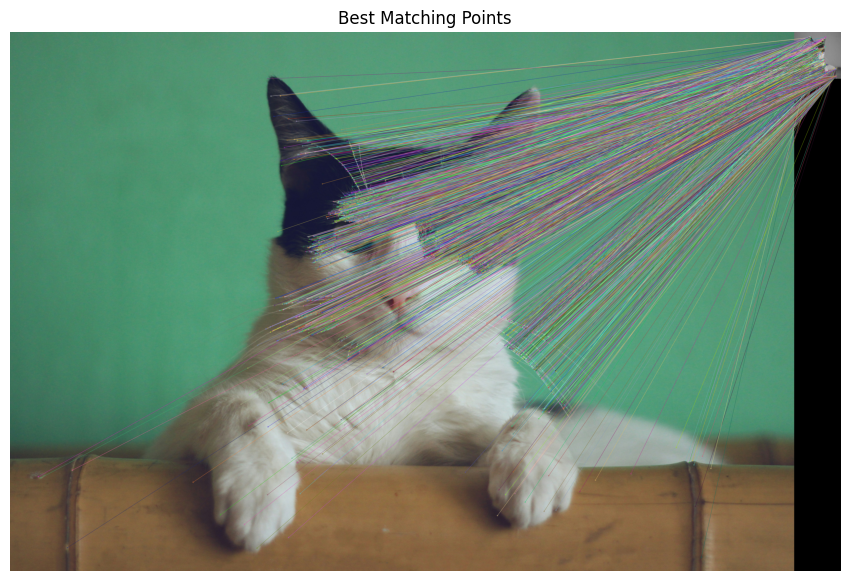


Number of Matching Keypoints Between The Training and Query Images:  4010


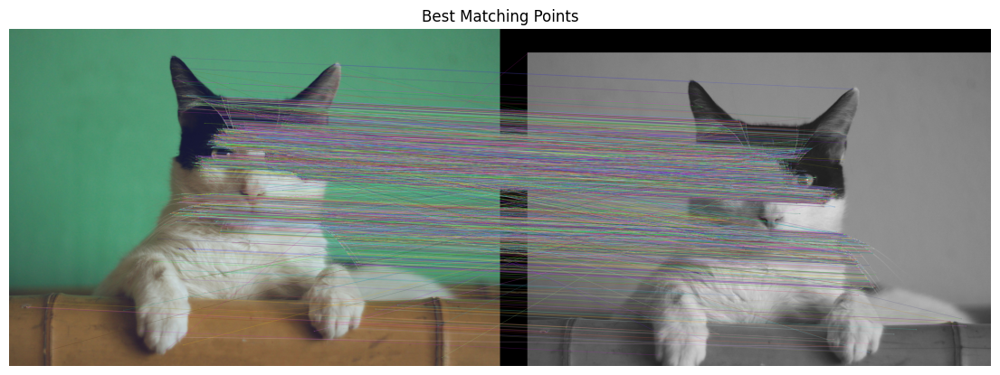


Number of Matching Keypoints Between The Training and Query Images:  4010


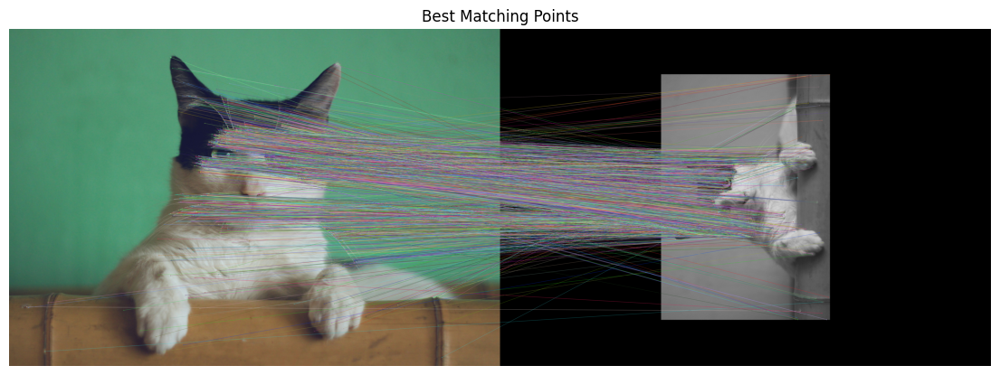


Number of Matching Keypoints Between The Training and Query Images:  4010


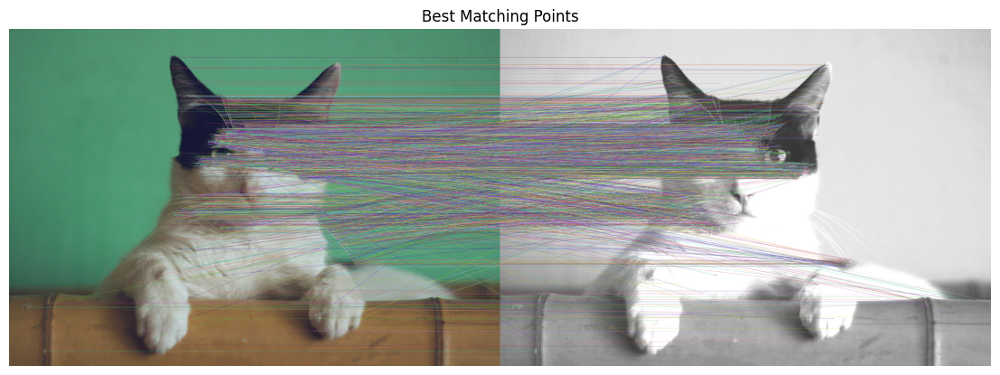

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)

for i in test_images:
  test_keypoints, test_descriptor = sift.detectAndCompute(i, None)
  matches = bf.match(train_descriptor, test_descriptor)
  matches = sorted(matches, key = lambda x : x.distance)
  print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))
  result = cv2.drawMatches(image_copy3, train_keypoints, i, test_keypoints, matches, i, flags = 2)
  plt.rcParams['figure.figsize'] = [14.0, 7.0]
  plt.title('Best Matching Points')

  plt.imshow(result)
  plt.axis("off")
  plt.show()




###SIFT on two completely different images (e.g., a cat and a dog)

(np.float64(-0.5), np.float64(5999.5), np.float64(3999.5), np.float64(-0.5))

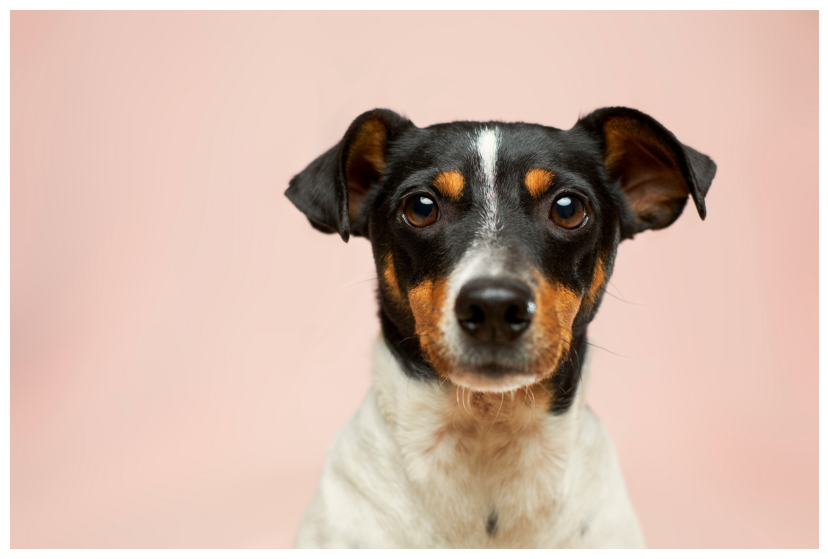

In [ ]:
image4 = cv2.imread('./dog.jpg')
image_copy4 = cv2.cvtColor(image4, cv2.COLOR_BGR2RGB)
plt.imshow(image_copy4)
plt.axis("off")

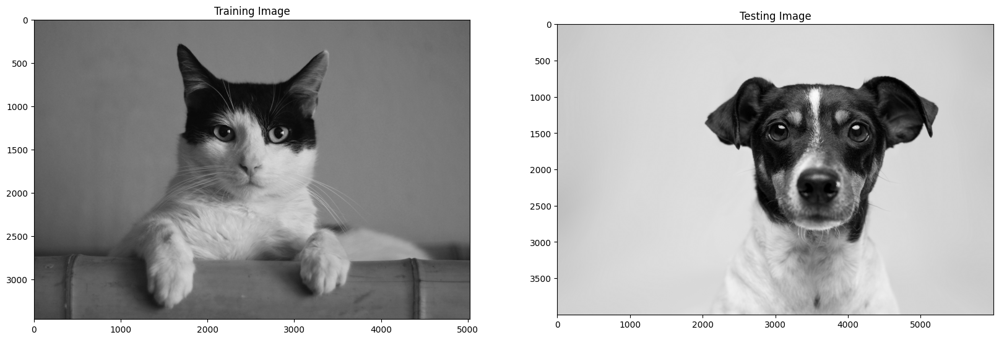

In [ ]:
sift = cv2.SIFT_create()
test_image = image_copy4 #dog
test_keypoints, test_descriptor = sift.detectAndCompute(test_image, None)
test_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)

# Display traning image and testing image
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Training Image")
plots[0].imshow(training_gray,cmap="gray")

plots[1].set_title("Testing Image")
plots[1].imshow(test_gray,cmap="gray")


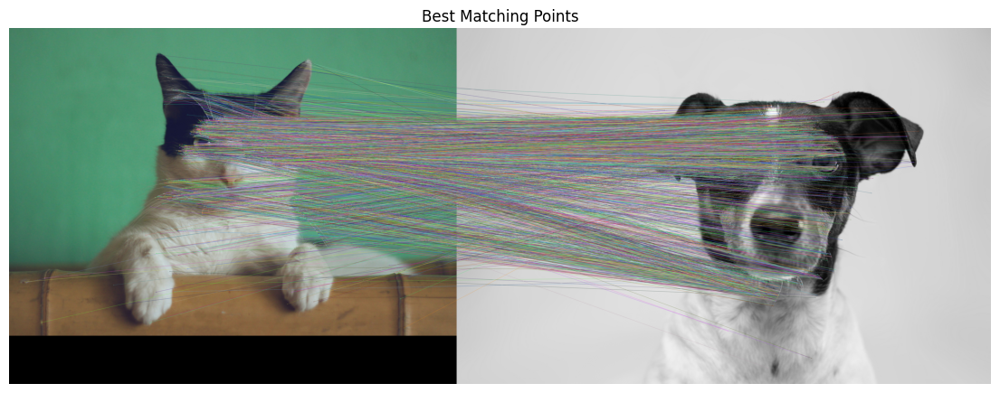


Number of Matching Keypoints Between The Training and Query Images:  4010

SIFT is not fooled by the dog disguise because the local features of a dog (snout, ears) are fundamentally different from a cat's,
 (no matching lines were drawn between them)creating unique descriptors that fail to match.


In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck = False)
matches = bf.match(train_descriptor, test_descriptor)
matches = sorted(matches, key = lambda x : x.distance)

result = cv2.drawMatches(image_copy3, train_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)
plt.rcParams['figure.figsize'] = [14.0, 7.0]
plt.title('Best Matching Points')
plt.imshow(result)
plt.axis("off")
plt.show()

print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))
print("\nSIFT is not fooled by the dog disguise because the local features of a dog (snout, ears) are fundamentally different from a cat's,\n (no matching lines were drawn between them)creating unique descriptors that fail to match.")

#QUESTION 3

###Load and preprocess the image

(np.float64(-0.5), np.float64(4499.5), np.float64(2999.5), np.float64(-0.5))

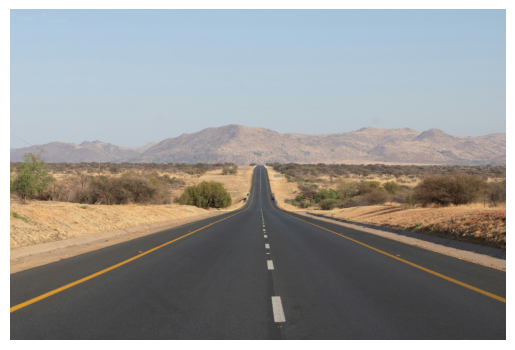

In [ ]:
image5 = cv2.imread('./lane_marking.jpg')
image_copy5 = cv2.cvtColor(image5, cv2.COLOR_BGR2RGB)
plt.imshow(image_copy5)
plt.axis("off")

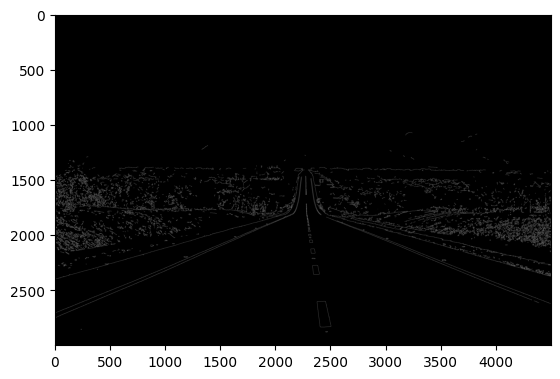

In [ ]:
img_gray=cv2.cvtColor(image_copy5, cv2.COLOR_RGB2GRAY)
filtered_image = cv2.GaussianBlur(img_gray, (5, 5), sigmaX=20)
low_threshold = 50 #not an edge
high_threshold = 100 #an edge
lane_marking = cv2.Canny(filtered_image, low_threshold, high_threshold)
plt.imshow(lane_marking, cmap='gray')

###Detect Lane Lines using Hough Line Transform

(np.float64(-0.5), np.float64(4499.5), np.float64(2999.5), np.float64(-0.5))

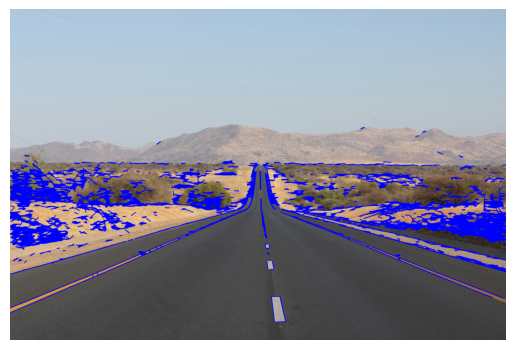

In [ ]:
rho = 1
theta = np.pi/180
threshold = 20
min_line_length = 20
max_line_gap = 30
lane=np.copy(image_copy5)
lines = cv2.HoughLinesP(lane_marking, rho, theta, threshold, np.array([]),
                        min_line_length, max_line_gap)

for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(lane,(x1,y1),(x2,y2),(0,0,255),5)

plt.imshow(lane)
plt.axis("off")

###Detect Traffic Signs using Hough Circle Transform

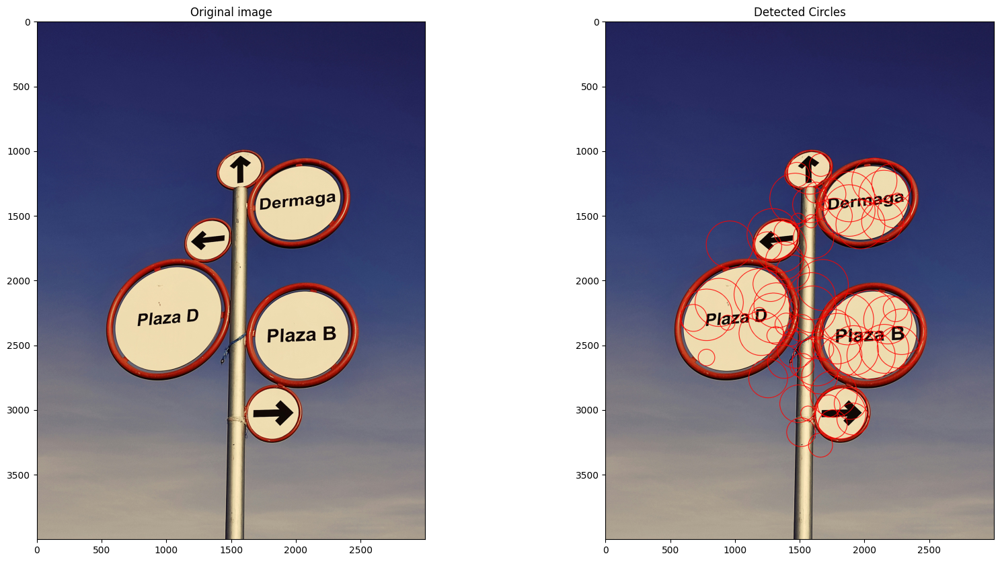

In [ ]:
image6 = cv2.imread('./trafficlight.jpg')
image_copy6 = cv2.cvtColor(image6, cv2.COLOR_BGR2RGB)
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Original image")
plots[0].imshow(image_copy6)

gray = cv2.cvtColor(image_copy6, cv2.COLOR_RGB2GRAY)
blurred = cv2.GaussianBlur(gray, (9, 9), 2)

circles = cv2.HoughCircles(
    blurred,
    cv2.HOUGH_GRADIENT,
    dp=1.2,
    minDist=100,
    param1=100,
    param2=30,
    minRadius=30,
    maxRadius=200
)

circles = np.uint16(np.around(circles))

for i in circles[0, :]:
  center = (i[0], i[1])
  radius = i[2]
  cv2.circle(image_copy6, center, radius, (255, 0, 0), 3)


plots[1].set_title("Detected Circles")
plots[1].imshow(image_copy6)



###Display the final output

(np.float64(-0.5), np.float64(2999.5), np.float64(3999.5), np.float64(-0.5))

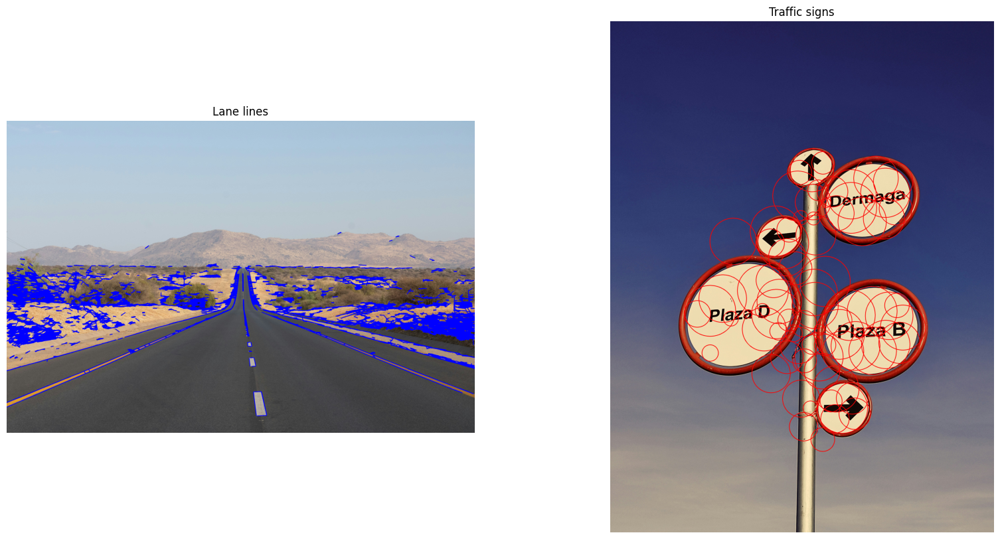

In [ ]:
fx, plots = plt.subplots(1, 2, figsize=(20,10))

plots[0].set_title("Lane lines")
plots[0].imshow(lane)
plots[0].axis("off")
plots[1].set_title("Traffic signs")
plots[1].imshow(image_copy6)
plots[1].axis("off")